In [ ]:
%%capture
!pip install super-gradients==3.1.0
!pip install imutils
!pip install roboflow
!pip install pytube --upgrade

In [ ]:
pip install super_gradients


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 16.4 MB/s eta 0:00:00
  Using cached boto3-1.34.33-py3-none-any.whl (139 kB)
  Using cached Deprecated-1.2.14-py2.py3-none-any.whl (9.6 kB)
  Using cached coverage-5.3.1-cp310-cp310-linux_x86_64.whl
  Using cached Sphinx-4.0.3-py3-none-any.whl (2.9 MB)
  Using cached sphinx_rtd_theme-2.0.0-py2.py3-none-any.whl (2.8 MB)
  Using cached torchmetrics-0.8.0-py3-none-any.whl (408 kB)
  Using cached hydra_core-1.3.2-py3-none-any.whl (154 kB)
  Using cached omegaconf-2.3.0-py3-none-any.whl (79 kB)
  Using cached onnxruntime-1.13.1-cp310-cp310-manylinux_2_27_x86_64.whl (4.5 MB)
  Using cached onnx-1.13.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.5 MB)
  Using cached pyparsing-2.4.5-py2.py3-none-any.whl (67 kB)
  Using cached einops-0.3.2-py3-none-any.whl (25 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached treeli

In [ ]:
from super_gradients.training import Trainer
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val

[2024-02-02 13:19:06] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2024-02-02 13:19:06] WARNING - __init__.py - Failed to import pytorch_quantization
[2024-02-02 13:19:06] INFO - utils.py - NumExpr defaulting to 2 threads.
[2024-02-02 13:19:18] WARNING - calibrator.py - Failed to import pytorch_quantization
[2024-02-02 13:19:18] WARNING - export.py - Failed to import pytorch_quantization
[2024-02-02 13:19:18] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2024-02-02 13:19:18] WARNING - env_sanity_check.py - Failed to verify installed packages: boto3 required but not found
[2024-02-02 13:19:18] WARNING - env_sanity_check.py - Failed to verify installed packages: deprecated required but not found
[2024-02-02 13:19:18] WARNING - env_sanity_check.py - Failed to verify installed packages: coverage required but not found
[2024-02-02 13:19:18] WARNING - env_sanity_check.py - Failed to verify installed packages: sphinx-rtd-theme required but not found
[2024-02-02 13:19:18] WARNING - env_sanity_check.py - Failed to verify i

In [ ]:
from IPython.display import clear_output

In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback



In [ ]:
from super_gradients.training import models


In [ ]:
CHECKPOINT_DIR = 'checkpoints'
trainer = Trainer(experiment_name='retail_yolonas_run', ckpt_root_dir=CHECKPOINT_DIR)

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="I2WvbNGu6s6tNES0jQvr")
project = rf.workspace("iit-patna-qg1jh").project("reliance")
dataset = project.version(3).download("yolov8")



loading Roboflow workspace...
loading Roboflow project...
[WARNING] we noticed you are downloading a `yolov8` datasets but you don't have `ultralytics` installed. Roboflow `.deploy` supports only models trained with `ultralytics==8.0.196`, to intall it `pip install ultralytics==8.0.196`.


Extracting Dataset Version Zip to Reliance-3 in yolov8::  84%|████████▍ | 3007/3565 [00:01<00:00, 3927.05it/s]

In [ ]:
dataset_params = {
    'data_dir':'/content/Reliance-3',
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': ['5050_Britannia',
'7up',
'7up_Can',
'Agni_Tea',
'Amul_Butter',
'Amul_Cheese',
'Amul_Cream',
'Amul_Ghee',
'Amul_Gold',
'Amul_Kool',
'Amul_Lassi',
'Amul_Masti',
'Amul_Pro',
'Amul_Taaza',
'Amulya',
'Anik_Ghee',
'Annapurna_Ghee',
'AppyFizz',
'BNatural',
'Bambino',
'BestFarms',
'Bourbon_Biscuit',
'Bournvita',
'Britannia_Cheese',
'Britannia_Lassi',
'Catch',
'Cavins',
'Chings_Noodle',
'ChocoPie',
'Chocos_Kellogs',
'Chutney_Chings',
'Chutney_Dabur',
'Cocacola',
'Cocacola_Can',
'CoconutWater_Paperboat',
'CoconutWater_Real',
'Coffee_Nescafe',
'Comfort',
'Complan',
'CornFlakes_Aarambh',
'CornFlakes_Bagrrys',
'CornFlakes_Kellogs',
'Daawat_Brown',
'Daawat_Devaaya',
'Daawat_Rice',
'DarkFantasy',
'DarkFantasy_Biscuit',
'Delicious',
'DietCoke',
'Domex',
'Dove_Soap',
'Enzo',
'Everest',
'Fanta',
'Fiama_Soap',
'Fortune_Refined',
'Fortune_Rice',
'Frooti',
'GluconD',
'Go_Cheese',
'GoodDay_Britannia',
'GoodLife',
'GoodLife_Rice',
'Govardhan_Ghee',
'HOrlicks',
'Henko',
'Hersheys_ChocolateShake',
'Hersheys_Milkshake',
'Honey_Dabur',
'Honey_HealthyLife',
'Honey_Himalaya',
'Honey_Patanjali',
'Honey_Suffola',
'IndiaGate_BrownRice',
'IndiaGate_Dubar',
'IndiaGate_Rice',
'Jubilee_Rice',
'Kaffe',
'Ketchup_Kissan',
'Ketchup_Maggi',
'KrackJack_Parle',
'Lays',
'Lipton',
'Lizol',
'MIlkyMist_Cheese',
'MTR',
'Maaza',
'Madhusudan_Ghee',
'Magg',
'Maggi',
'MarieGold_Britannia',
'Mayo_DelMonte',
'Mayo_DrOetker',
'Mayo_Wingreens',
'McVities',
'Milkbikies',
'Milkmaid',
'MilkyMist_CheeseSlices',
'Mirinda',
'MomsMagic',
'Monaco_Parle',
'Monster',
'Muesli_Aarambh',
'Muesli_Bagrrys',
'Muesli_Kellogs',
'Namkeen',
'Nescafe',
'Nutella',
'Nutralite',
'NutriChoice_Britannia',
'Oats_Aarambh',
'Oats_Bagrrys',
'Oats_Suffola',
'Oats_Tata',
'OrganicIndia_Tea',
'Osom_Paneer',
'Paperboat',
'Paras_Ghee',
'Parle-G_Parle',
'Patanjali_Ghee',
'PeanutButter_DiSano',
'PeanutButter_Sundrop',
'Pears_Soap',
'Pepsi',
'Pepsi_Can',
'Pickle_Mothers',
'Pickle_Sachet_Mothers',
'Pringles',
'Raw',
'Raw_CoconutWater',
'Real',
'Real_Active',
'Real_Guava',
'RedBull',
'RedLabel',
'RefinedOil',
'Revive',
'Rock_Salt',
'Roohafza',
'Rusk_Parle',
'Santoor_Soap',
'Shampoo',
'Slice',
'SnacTac',
'Soda_Kinley',
'Sofit_SoyaMilk',
'Sprite',
'Sprite_Can',
'Sting',
'Storia',
'Storia_Shake',
'Sunfeast_ChocolateDrink',
'Sunfeast_MangoeDrink',
'Sunfeast_StrawberryDrink',
'SurfExcel',
'Taaza',
'TajMahal',
'Tang',
'Tata_Gold',
'Tata_Premium',
'Tata_Salt',
'ThumpsUp',
'ThumpsUp_Can',
'Tide',
'Tiger_Britannia',
'Toothpaste_Colgate',
'Toothpaste_Dabur',
'Toothpaste_Pepsodent',
'Toothpaste_Sensodine',
'Tropicana',
'Water_Kinley',
'Weikfield',
'WinkinCow_Chocolate',
'WinkinCow_LAssi',
'Yeah',
'p'
]

}


In [ ]:


train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

# test_data = coco_detection_yolo_format_val(
#     dataset_params={
#         'data_dir': dataset_params['data_dir'],
#         'images_dir': dataset_params['test_images_dir'],
#         'labels_dir': dataset_params['test_labels_dir'],
#         'classes': dataset_params['classes']
#     },
#     dataloader_params={
#         'batch_size':16,
#         'num_workers':2
#     }
# )

clear_output()

In [ ]:
train_data.dataset.transforms

In [ ]:
train_data.dataset.dataset_params['transforms'][1]

{'DetectionRandomAffine': {'degrees': 10.0, 'translate': 0.1, 'scales': [0.1, 2], 'shear': 2.0, 'target_size': [640, 640], 'filter_box_candidates': True, 'wh_thr': 2, 'area_thr': 0.1, 'ar_thr': 20}}

In [ ]:
train_data.dataset.dataset_params['transforms'][1]['DetectionRandomAffine']['degrees'] = 10.42

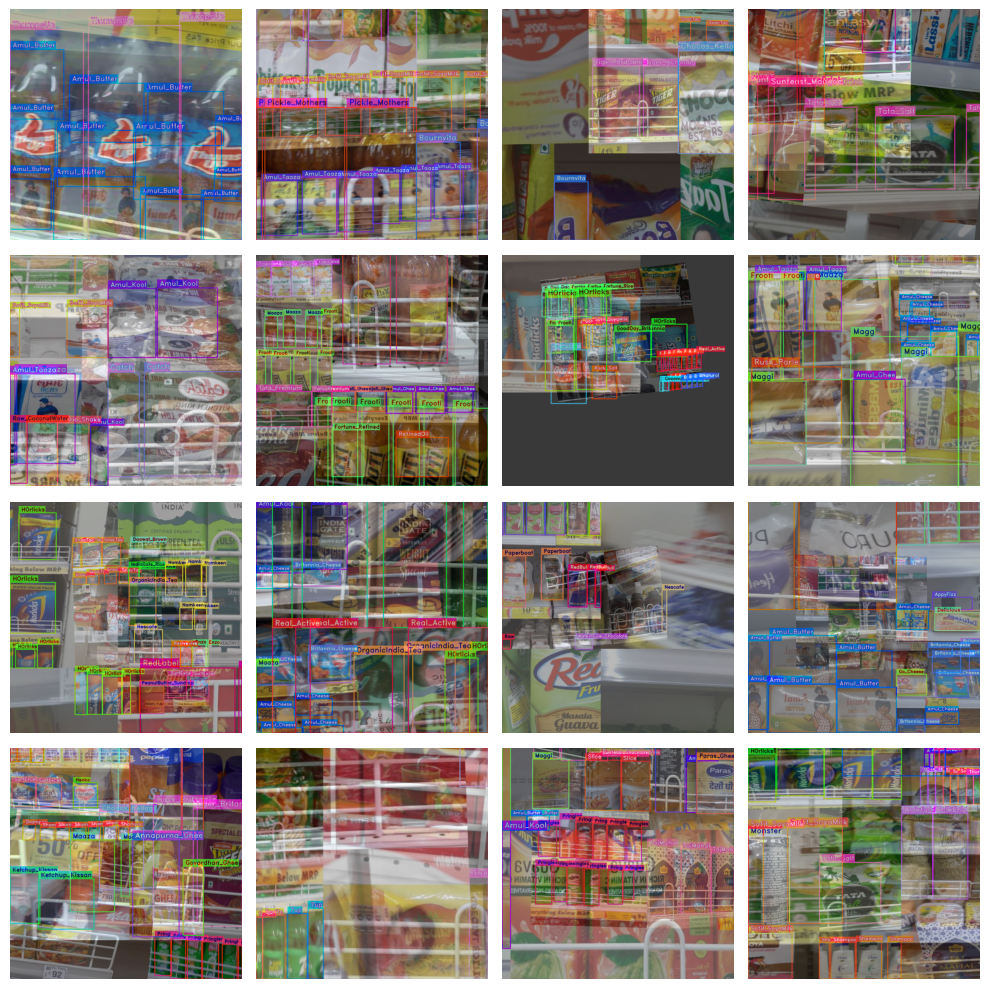

In [ ]:
train_data.dataset.plot()

In [ ]:
model = models.get('yolo_nas_m',
                   num_classes=len(dataset_params['classes']),
                   pretrained_weights="coco"
                   )

[2024-02-02 13:19:42] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_m_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_m_coco.pth
100%|██████████| 196M/196M [00:06<00:00, 31.4MB/s]
[2024-02-02 13:19:50] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_m


In [ ]:
train_params = {
    # ENABLING SILENT MODE
    'silent_mode': True,
    "average_best_models":True,
    "warmup_mode": "LinearEpochLRWarmup",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 15,
    "mixed_precision": True,
    "loss": PPYoloELoss(
    use_static_assigner=False,
    num_classes=len(dataset_params['classes']),
    reg_max=16,
    ),

    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}





In [ ]:
import torch
print(torch.cuda.is_available())

In [ ]:
trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

True


[2024-02-02 13:19:50] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20240202_131950_759398`
[2024-02-02 13:19:50] INFO - sg_trainer.py - Checkpoints directory: checkpoints/retail_yolonas_run/RUN_20240202_131950_759398
[2024-02-02 13:19:50] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}


The console stream is now moved to checkpoints/retail_yolonas_run/RUN_20240202_131950_759398/console_Feb02_13_19_50.txt


[2024-02-02 13:20:00] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            1517       (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         94         (len(train_loader))
    - Gradient updates per epoch:   94         (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_M  (51.25M parameters, 51.25M optimized)
    - Learning Rates and Weight Decays:
      - default: (51.25M parameters). LR: 0.0005 (51.25M parameters) WD: 0.0, (72.73K parameters), WD: 0.0001, (51.17M parameters)

[2024-02-02 13:22:20] INFO - base_sg_logger.py - Checkpoint saved i

In [ ]:

best_model = models.get('yolo_nas_m',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path="/content/checkpoints/retail_yolonas_run/RUN_20240202_131950_759398/ckpt_best.pth")

[2024-02-02 13:58:56] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/retail_yolonas_run/RUN_20240202_131950_759398/ckpt_best.pth EMA checkpoint.


In [ ]:
|# trainer.test(
#     model=best_model,
#     test_loader=test_data,
#     test_metrics_list=DetectionMetrics_050(
#         score_thres=0.1,
#         top_k_predictions=300,
#         num_cls=len(dataset_params['classes']),
#         normalize_targets=True,
#         post_prediction_callback=PPYoloEPostPredictionCallback(
#             score_threshold=0.01,
#             nms_top_k=1000,
#             max_predictions=300,
#             nms_threshold=0.7
#         )
#     )
# )

In [ ]:
# trainer.test(model=best_model,
#             test_metrics_list=DetectionMetrics_050(score_thres=0.1,
#                                                    top_k_predictions=300,
#                                                    num_cls=len(dataset_params['classes']),
#                                                    normalize_targets=True,
#                                                    post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01,
#                                                                                                           nms_top_k=1000,
#                                                                                                           max_predictions=300,
#                                                                                                           nms_threshold=0.7)
#                                                   ))

In [ ]:
IMAGES = "/content/Reliance-3/valid/images/20230812_082843_jpg.rf.100d505e7516a5e20141a3adf5ce9f3b.jpg"
best_model.predict(IMAGES).show()

In [ ]:
IMAGES1 = "/content/7up-2-liter-bottle12101891748.webp"
best_model.predict(IMAGES1).show()

In [ ]:
IMAGES2 = "/content/Reliance-3/valid/images/20230812_082746_jpg.rf.2f93c4edad19fbc4097e731e70210f80.jpg"
best_model.predict(IMAGES2).show()

image_prediction = best_model.predict(IMAGES2)

In [ ]:
class_names = image_prediction.class_names
labels      = image_prediction.prediction.labels
confidence  = image_prediction.prediction.confidence
bboxes      = image_prediction.prediction.bboxes_xyxy

In [ ]:
labels

In [ ]:
IMAGES3 = "/content/Reliance-3/valid/images/20230730_104732_jpg.rf.a4c05c25b7cddca8d52da4ba188f3e6f.jpg"
best_model.predict(IMAGES3).show()

In [ ]:
IMAGES4 = "/content/265689-2_5-frooti-drink-fresh-n-juicy-mango.webp"
best_model.predict(IMAGES4).show()

In [ ]:
IMAGES4 = "/content/Reliance-3/valid/images/20230730_104222_jpg.rf.edf8c84e77d71951620d7e902bcca3c0.jpg"
best_model.predict(IMAGES4).show()

# image_prediction = best_model.predict(IMAGES4)

In [ ]:

# labels = image_prediction.prediction.labels
# confidence = image_prediction.prediction.confidence
# bboxes = image_prediction.prediction.bboxes_xyx

class_names = image_prediction.class_names
labels      = image_prediction.prediction.labels
confidence  = image_prediction.prediction.confidence
bboxes      = image_prediction.prediction.bboxes_xyxy

In [ ]:
labels

In [ ]:
labels = [156]

# Product-cost mapping
product_costs = {
    # 0: {'product': 'Water Bottle', 'cost': 1.00},
    156: {'product': 'Saffola Oats', 'cost': 2.50},
    # Add more entries for other labels if needed
}

total_cost = 0

# Process the detected labels and calculate the total cost
for label in labels:
    if label in product_costs:
        product = product_costs[label]['product']
        cost = product_costs[label]['cost']
        total_cost += cost
        print(f"Detected: {product} (Cost: ${cost:.2f}), Total Cost: ${total_cost:.2f}")

# Display the total cost at the end
print(f"\nTotal Cost: ${total_cost:.2f}")

[2024-02-02 16:30:13] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


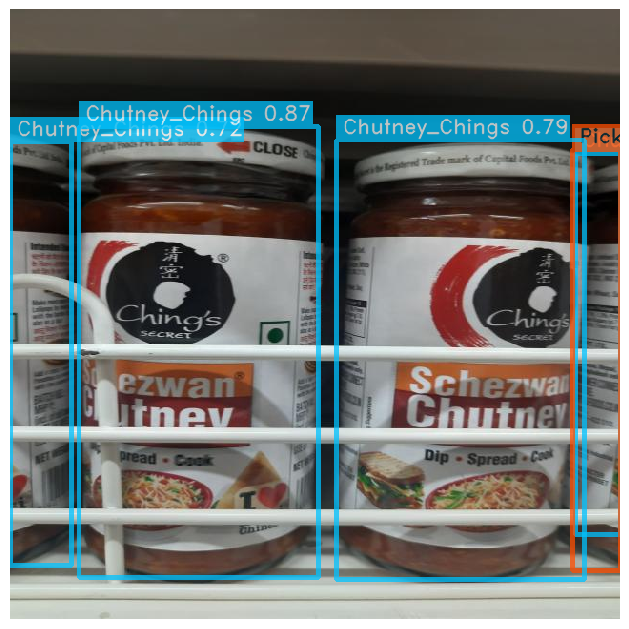

In [ ]:
IMAGES5 = "/content/Reliance-3/valid/images/20230730_104547_jpg.rf.12bde185ca8a1550d724fe508c0f153d.jpg"
best_model.predict(IMAGES5).show()

[2024-02-02 16:31:41] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


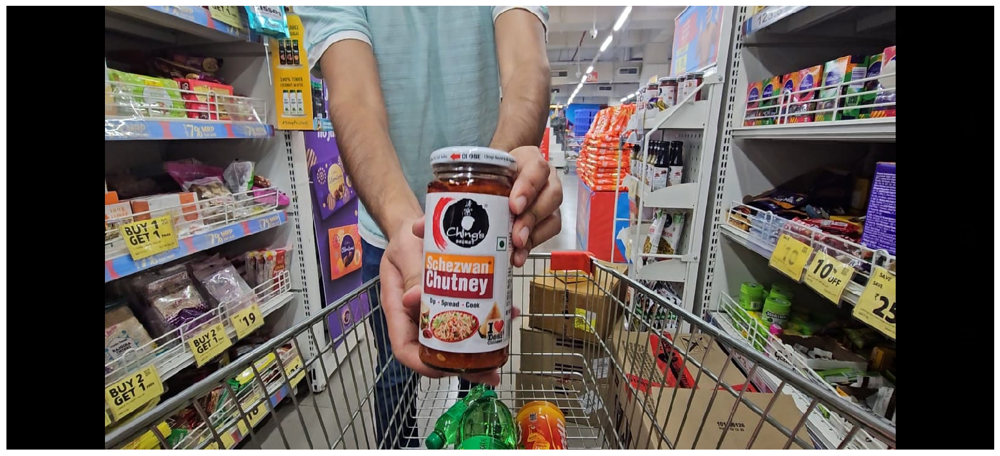

In [ ]:
IMAGES6 = "/content/WhatsApp Image 2024-02-01 at 23.39.23_c3c350d8.jpg"
best_model.predict(IMAGES6).show()

In [ ]:
IMAGES7 = "//content/Reliance-3/valid/images/20230819_081739_jpg.rf.8d7fed3c85e1f452a8bd1c1c98dbdeaf.jpg"
best_model.predict(IMAGES7).show()


In [ ]:
# /content/Reliance-3/valid/images/20230819_081739_jpg.rf.8d7fed3c85e1f452a8bd1c1c98dbdeaf.jpg

IMAGES8 = "/content/265689-2_5-frooti-drink-fresh-n-juicy-mango.webp"
best_model.predict(IMAGES8).show()

[2024-02-02 16:32:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


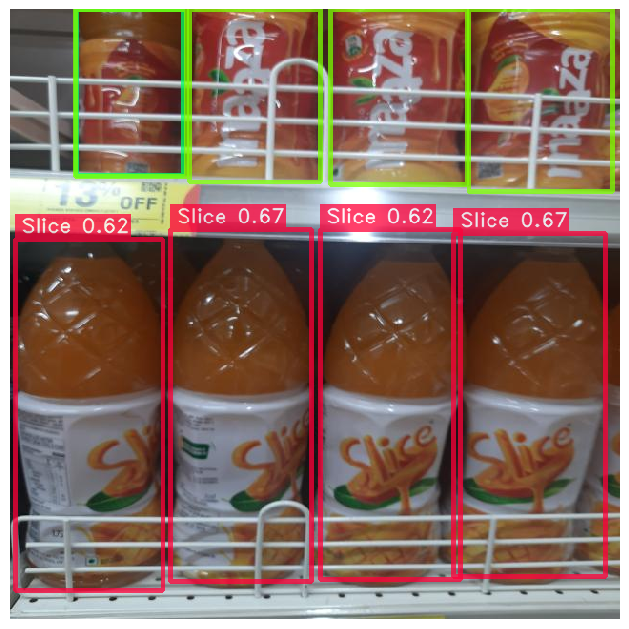

In [ ]:

IMAGES9 = "/content/Reliance-3/valid/images/20230730_110312_jpg.rf.f117947ada50a4e183dab03479ff590b.jpg"
best_model.predict(IMAGES9).show()

[2024-02-02 16:32:46] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


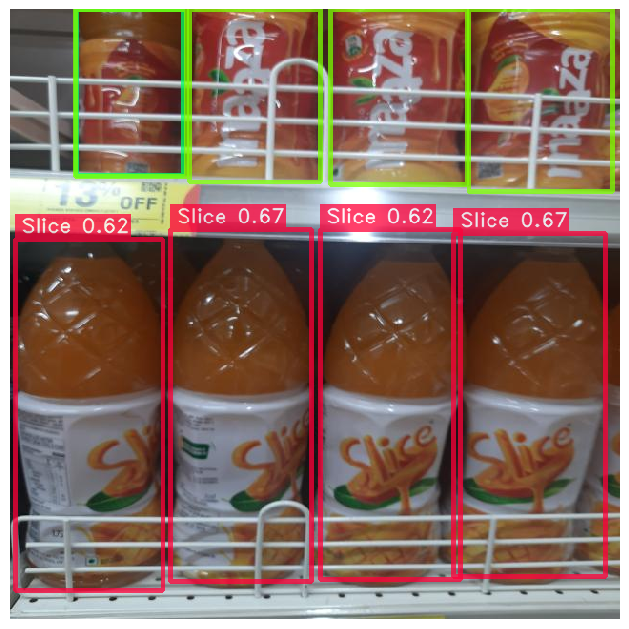

In [ ]:
IMAGES9 = "/content/Reliance-3/valid/images/20230730_110312_jpg.rf.f117947ada50a4e183dab03479ff590b.jpg"
best_model.predict(IMAGES9).show()

In [ ]:

IMAGES10 = "/content/265884_6-tropicana-juice-slice-mango.webp"
best_model.predict(IMAGES10).show()

FileNotFoundError: [Errno 2] No such file or directory: '/content/265884_6-tropicana-juice-slice-mango.webp'

In [ ]:


IMAGES11 = "/content/maaza-600ml-pack-of-24-bottles--1000x1000.jpg"
best_model.predict(IMAGES11).show()

[2024-02-02 16:32:58] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


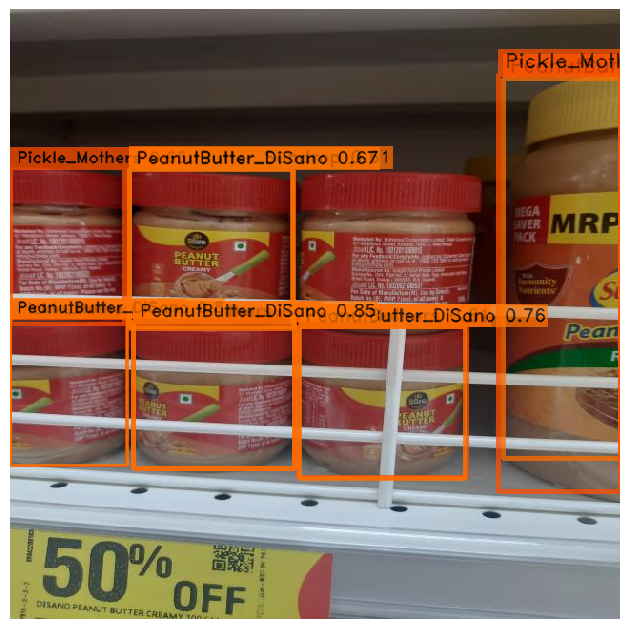

In [ ]:

IMAGES12= "/content/Reliance-3/valid/images/20230730_104331_jpg.rf.cdfae4d568bb5557e87b533562efb1bd.jpg"
best_model.predict(IMAGES12).show()

[2024-02-02 16:33:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


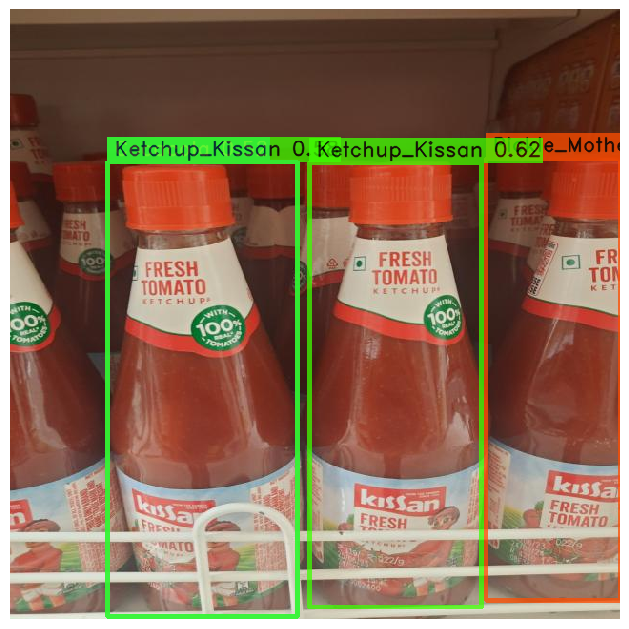

In [ ]:

IMAGES13= "//content/Reliance-3/valid/images/20230730_104500_jpg.rf.40651c3a40ed4489ad9f2066bb07ef4b.jpg"
best_model.predict(IMAGES13).show()

[2024-02-02 16:33:21] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


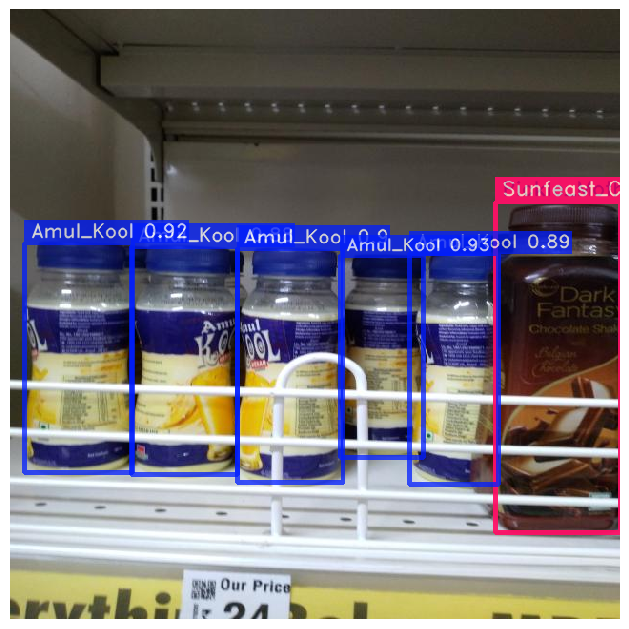

In [ ]:
IMAGES14= "/content/Reliance-3/valid/images/20230819_081925_jpg.rf.27f33a95d46a425dbb123ff4dbcbfa22.jpg"
best_model.predict(IMAGES14).show()

[2024-02-02 16:33:28] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


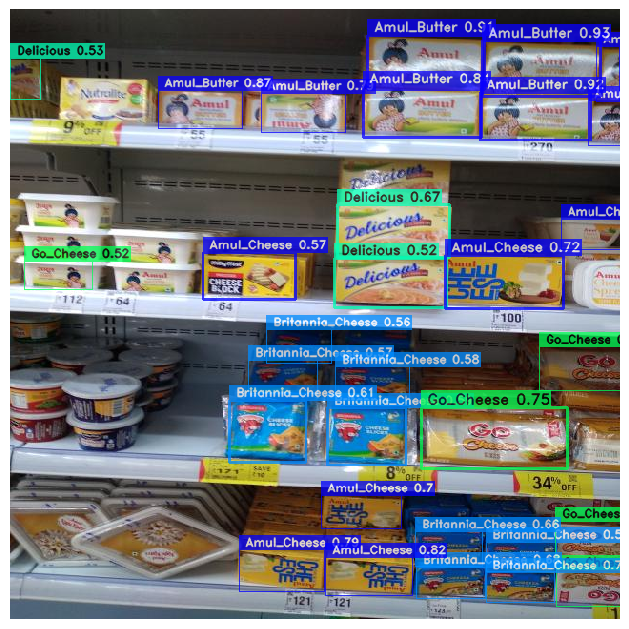

In [ ]:

IMAGES14= "/content/Reliance-3/valid/images/20230819_081704-1-_jpg.rf.2de451781638a8ffe34e7d193bdcbd80.jpg"
best_model.predict(IMAGES14).show()

In [ ]:

IMAGES15= "/content/Reliance-3/valid/images/20230819_082013_jpg.rf.8a6f50ced3a47d6929c9c0b9fdad2b4c.jpg"
best_model.predict(IMAGES15).show()

[2024-02-02 14:01:44] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


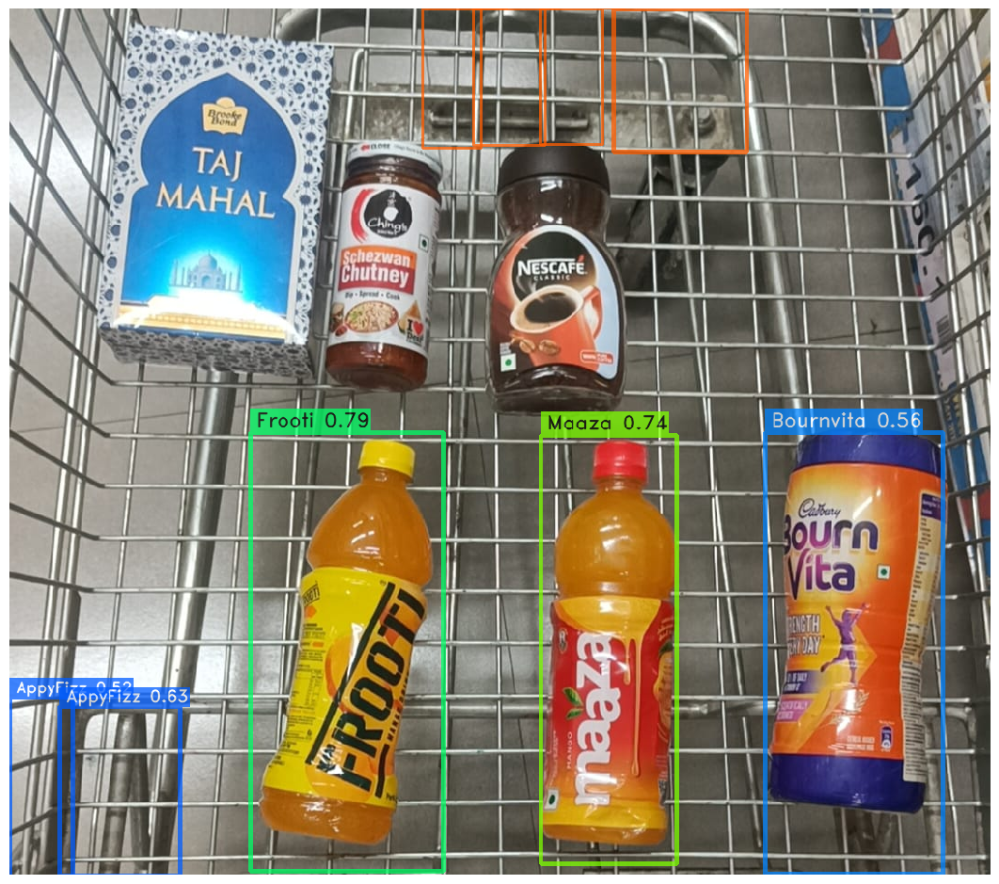

In [ ]:

IMAGES16= "/content/WhatsApp Image 2024-02-02 at 19.34.10_f15f0594.jpg"
best_model.predict(IMAGES16).show()

In [ ]:
IMAGES17= "/content/WhatsApp Image 2024-02-02 at 19.41.45_13344bb8.jpg"
best_model.predict(IMAGES17).show()

[2024-02-02 14:16:18] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


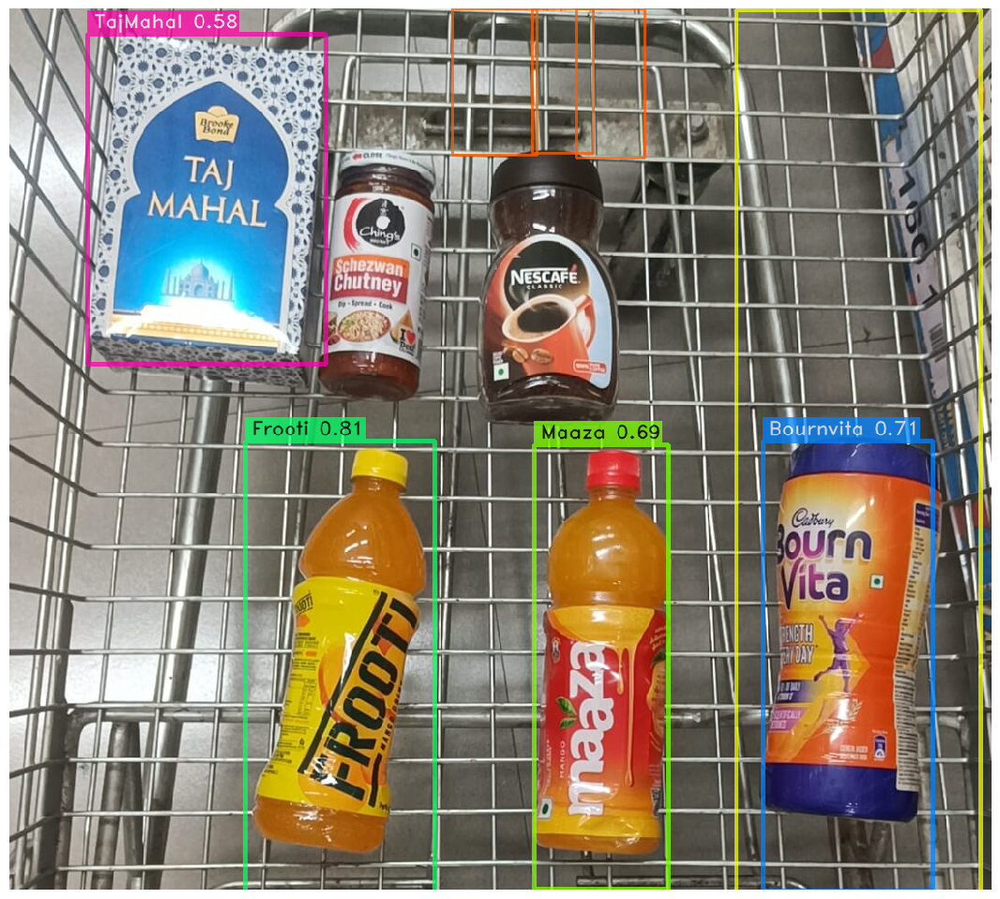

[2024-02-02 14:16:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


In [ ]:
IMAGES16= "/content/WhatsApp Image 2024-02-02 at 19.48.38_9eae4c35.jpg"
# images=best_model.predict(IMAGES16).show()
best_model.predict(IMAGES16).show()

image_prediction1 = best_model.predict(IMAGES16)

In [ ]:
import cv2

# Replace 'your_video_file.mp4' with the path to your video file
video_path = '/content/WhatsApp Video 2024-02-02 at 19.51.34_d9391903.mp4'

# Open the video file
cap = cv2.VideoCapture(video_path)

# Get the total number of frames in the video
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# Set the capture position to the middle frame
mid_frame_index = total_frames // 2
cap.set(cv2.CAP_PROP_POS_FRAMES, mid_frame_index)

# Read the frame from the middle
ret, mid_frame = cap.read()

# Release the video capture object
cap.release()

# Increase the size of the image (optional, adjust as needed)
scale_factor = 2
height, width, _ = mid_frame.shape
new_size = (width * scale_factor, height * scale_factor)
resized_frame = cv2.resize(mid_frame, new_size)

# Save the resized frame as an image
cv2.imwrite('mid_frame_clear.jpg', resized_frame)

True

[2024-02-02 14:27:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


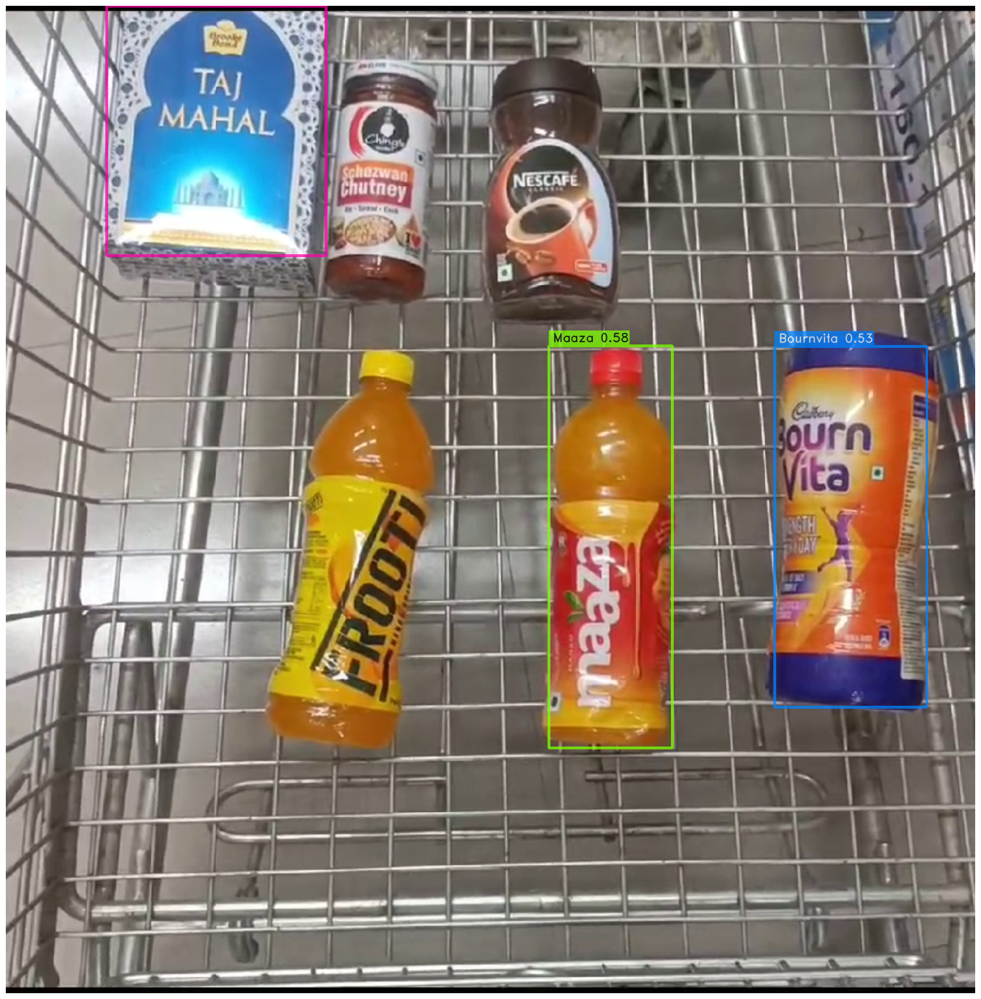

[2024-02-02 14:27:40] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


In [ ]:
# /content/mid_frame_clear.jpg
IMAGESmid= "/content/mid_frame_clear.jpg"
# images=best_model.predict(IMAGES16).show()
best_model.predict(IMAGESmid).show()

image_prediction3 = best_model.predict(IMAGESmid)

[2024-02-02 19:23:00] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


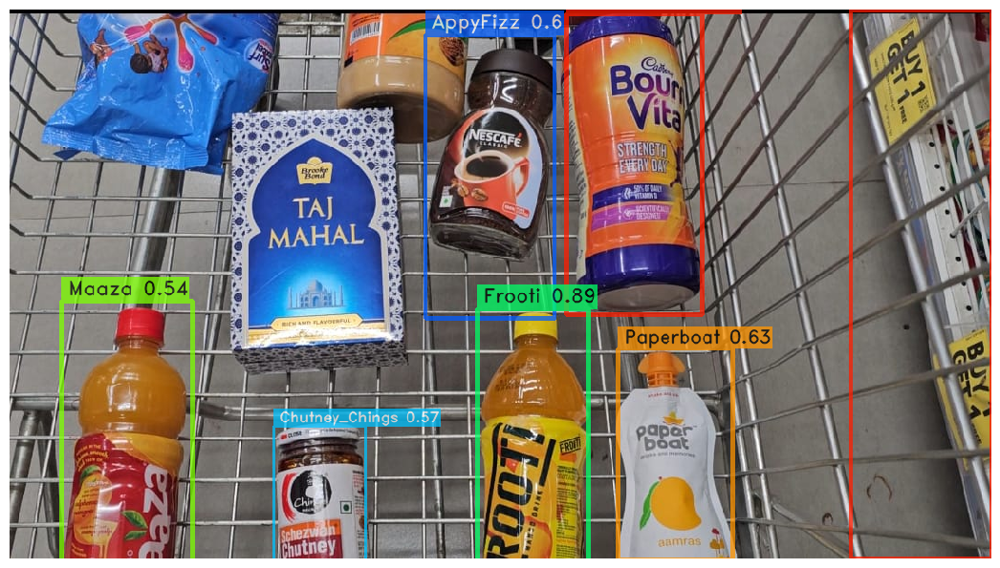

[2024-02-02 19:23:01] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


In [ ]:
IMAGES17= "/content/WhatsApp Image 2024-02-03 at 00.55.12_8e8ddb58.jpg"
# images=best_model.predict(IMAGES16).show()
best_model.predict(IMAGES17).show()

image_prediction2 = best_model.predict(IMAGES17)

In [ ]:
labels2= image_prediction2.prediction.labels
class_names2 = image_prediction2.class_names


In [ ]:
57-frooti,86-Maaza,22-bourn,156-Taj Mahal

In [ ]:
labels2

array([ 57, 116, 131,  17,  30, 131,  86])

In [ ]:
class_names

In [ ]:
input_video_path=f"/content/WhatsApp Video 2024-02-02 at 23.40.59_e449b35c.mp4"
output_video_path="detection_output1.mp4"

In [ ]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"

In [ ]:
best_model.to(device).predict(input_video_path).save(output_video_path)

Processing Video:  98%|█████████▊| 585/596 [00:23<00:00, 30.57it/s]

In [ ]:
import cv2

# Replace 'your_video_file.mp4' with the path to your video file
video_path = '/content/WhatsApp Video 2024-02-02 at 19.51.34_d9391903.mp4'

# Open the video file
cap = cv2.VideoCapture(video_path)

# Get the total number of frames in the video
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# Set the capture position to the last frame
cap.set(cv2.CAP_PROP_POS_FRAMES, total_frames - 1)

# Read the last frame
ret, last_frame = cap.read()

# Release the video capture object
cap.release()

# Increase the size of the image (optional, adjust as needed)
scale_factor = 2
height, width, _ = last_frame.shape
new_size = (width * scale_factor, height * scale_factor)

# Resize the image
resized_frame = cv2.resize(last_frame, new_size)

# Save the resized frame as an image
cv2.imwrite('last_frame_clear_edit.jpg', resized_frame)

True

In [ ]:
from IPython.display import HTML
from base64 import b64encode
from google.colab import files
import os

# Input video path
save_path = '/content/detection_output1.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

# Reduce video size during compression
os.system(f"ffmpeg -i {save_path} -vcodec libx264 -vf scale=640:480 {compressed_path}")

# Display a link to download the compressed video
files.download(compressed_path)

Processing Video: 100%|██████████| 596/596 [00:23<00:00, 25.40it/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# import cv2

# # Assuming 'input_video_path' is defined
# cap = cv2.VideoCapture(input_video_path)

# count = 0
# while True:
#     ret,frame = cap.read()
#     count +=1
#     if ret:
#         result = best_model.to(device).predict(frame)
#         # bbox_xyxys = result.prediction.bboxes_xyxy.tolist()
#         # confidences = result.prediction.confidence
#         labels = result.prediction.labels.istype(int)


# cap.release()

In [ ]:
import cv2

# Assuming 'input_video_path' is defined
cap = cv2.VideoCapture(input_video_path)

count = 0
detected_labels = []  # List to store detected labels

while True:
    ret, frame = cap.read()
    count += 1

    if not ret:
        # Break the loop if there are no more frames to read
        break

    result = best_model.to(device).predict(frame)
    labels = result.prediction.labels

    if len(labels) > 0:  # Check if any labels are detected
        detected_labels.extend(labels)

cap.release()


# Now 'detected_labels' contains all the detected labels during the video processing
print("Detected Labels:", detected_labels)


[2024-02-02 18:21:41] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:21:42] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:21:42] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:21:42] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:21:42] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:21:43] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:21:43] INFO -

In [ ]:
print("Detected Labels:", detected_labels)

Detected Labels: [173, 173, 101, 173, 101, 101, 101, 101, 17, 156, 17, 156, 17, 17, 156, 17, 156, 17, 17, 17, 156, 17, 17, 156, 156, 156, 156, 141, 172, 172, 123, 123, 123, 123, 123, 123, 73, 123, 123, 123, 123, 123, 123, 173, 123, 173, 10, 10, 173, 10, 10, 123, 123, 10, 123, 123, 123, 17, 123, 123, 123, 123, 73, 73, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 161, 161, 1, 1, 123, 123, 123, 123, 123, 123, 123, 123, 123, 123, 123, 10, 73, 151, 141, 10, 73, 141, 10, 73, 10, 73, 10, 73, 10, 73, 10, 10, 73, 10, 10, 73, 10, 10, 10, 10, 10, 141, 10, 141, 10, 141, 10, 141, 10, 10, 10, 141, 10, 141, 10, 141, 141, 10, 10, 73, 73, 10, 10, 73, 73, 10, 10, 141, 10, 10, 123, 10, 10, 123, 10, 123, 123, 10, 123, 10, 10, 123, 10, 123, 123, 123, 123, 123, 64, 141, 123, 141, 123, 141, 141, 123, 123, 123, 123, 123, 123, 123, 123, 123, 123, 73, 123, 73, 73, 123, 123, 73, 161, 123, 73, 123, 123, 1, 123, 1, 123, 1, 1, 64, 123, 1, 123, 123, 1, 1, 123, 1, 1, 144, 144, 162, 162, 123, 1, 123, 1, 1,

In [ ]:
import cv2

# Assuming 'input_video_path' is defined
cap = cv2.VideoCapture(input_video_path)

count = 0
skip_every_n = 5  # Skip every 5 frames
detected_labels1 = []  # List to store detected labels

while True:
    ret, frame = cap.read()
    count += 1

    if not ret:
        # Break the loop if there are no more frames to read
        break

    # Skip frames according to the skip_every_n value
    if count % skip_every_n != 0:
        continue  # Skip this frame

    result = best_model.to(device).predict(frame)
    labels = result.prediction.labels

    if len(labels) > 0:  # Check if any labels are detected
        detected_labels1.extend(labels)

cap.release()



[2024-02-02 18:58:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:58:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:58:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:58:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:58:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:58:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-02 18:58:35] INFO -

In [ ]:

# Now 'detected_labels' contains all the detected labels during the video processing with more skipped frames
print("Detected Labels:", detected_labels1)

Detected Labels: [173, 101, 156, 17, 17, 156, 123, 123, 123, 173, 10, 123, 1, 1, 1, 1, 123, 123, 123, 10, 73, 151, 141, 10, 73, 10, 10, 141, 10, 10, 73, 73, 10, 123, 10, 10, 123, 123, 123, 73, 123, 123, 1, 123, 144, 1, 162, 1, 49, 49, 64, 123, 123, 123, 123, 162, 162, 141, 141, 57, 161, 162, 162, 162, 67, 161, 141, 162, 161, 162, 123, 141, 123, 10, 10, 123, 161, 50, 161, 141, 50, 50, 161, 50, 50, 50, 50, 50, 50, 50, 50, 161, 50, 50, 50, 50, 13, 13, 161, 13, 17, 17, 161, 161, 161, 156, 161, 161, 156, 161, 17, 161, 17, 161, 161, 123, 123, 123, 161, 123, 73, 161]


In [ ]:
from collections import Counter

counter = Counter(detected_labels1)
most_common_numbers = counter.most_common()
print("Most common numbers:", most_common_numbers)


Most common numbers: [(123, 25), (161, 19), (50, 15), (10, 12), (162, 8), (1, 7), (141, 7), (17, 6), (73, 6), (156, 4), (13, 3), (173, 2), (49, 2), (101, 1), (151, 1), (144, 1), (64, 1), (57, 1), (67, 1)]


In [ ]:
labels = [57, 86, 22, 156]
customer_name = "John Doe"  # Replace with the actual customer's name

# Product-cost mapping
product_costs = {
    57: {'product': 'Frooti', 'cost': 1.50},
    86: {'product': 'Maaza', 'cost': 2.00},
    22: {'product': 'Bournvita', 'cost': 3.50},
    156: {'product': 'Taj Mahal', 'cost': 2.50},
    # Add more entries for other labels if needed
}

total_cost = 0

# Process the detected labels and calculate the total cost
for label in labels:
    if label in product_costs:
        product = product_costs[label]['product']
        cost = product_costs[label]['cost']
        total_cost += cost
        print(f"Detected: {product} (Cost: ${cost:.2f}), Total Cost: ${total_cost:.2f}")

# Display additional details
print(f"\nCustomer Name: {customer_name}")
print("Thank you for shopping with us!")

# Display the total cost at the end
print(f"Total Cost: ${total_cost:.2f}")


Detected: Frooti (Cost: $1.50), Total Cost: $1.50
Detected: Maaza (Cost: $2.00), Total Cost: $3.50
Detected: Bournvita (Cost: $3.50), Total Cost: $7.00
Detected: Taj Mahal (Cost: $2.50), Total Cost: $9.50

Customer Name: John Doe
Thank you for shopping with us!
Total Cost: $9.50
